## DCE-MRI Data Analysis

In [1]:
# Imports
import sys
import time
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from RENT import RENT, stability

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline

from sklearn.model_selection import LeaveOneOut, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, matthews_corrcoef

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 2000)

sns.set()
warnings.filterwarnings("ignore")

In [3]:
# Reading data
clinical_data = pd.read_csv("../3) Adjusted data - 2023/data_blockX1_Clinicaldata_Feb2023.csv", index_col=0)
gene_scores = pd.read_csv("../3) Adjusted data - 2023/data_blockX2_GeneScores_Feb2023.csv", index_col=0)
abrix = pd.read_csv("../3) Adjusted data - 2023/data_blockX3_ABrix_Feb2023.csv", index_col=0)
ve = pd.read_csv("../3) Adjusted data - 2023/data_blockX4_Ve_Feb2023.csv", index_col=0)
ktrans = pd.read_csv("../3) Adjusted data - 2023/data_blockX5_Ktrans_Feb2023.csv", index_col=0)
csh = pd.read_csv("../3) Adjusted data - 2023/data_blockX6_CSH_Feb2023.csv", index_col=0)

## Data Exploration

In [4]:
# Dataframes' dimentions
clinical_data.shape, gene_scores.shape, abrix.shape, ve.shape, ktrans.shape, csh.shape

((67, 6), (67, 55), (67, 9), (67, 9), (67, 9), (67, 9))

In [5]:
# Target value counts (the same for all dataframes)
clinical_data[clinical_data.columns[-1]].value_counts()

0    42
1    25
Name: target, dtype: int64

In [6]:
clinical_data.isnull().sum() # Missing values in each column.

FIGO_stage            0
Tumor_volum_mm3       1
LN_status             0
FIGO_stage_2groups    0
n.voxels              0
target                0
dtype: int64

In [7]:
gene_scores.isnull().sum() # Missing values in each column.

Dless_MINUS_Dmore                                   0
ESTIMATEScore                                       0
ESTIMATE_ImmuneScore                                0
ESTIMATE_StromalScore                               0
Score_HALLMARK_ADIPOGENESIS                         0
Score_HALLMARK_ALLOGRAFT_REJECTION                  0
Score_HALLMARK_ANDROGEN_RESPONSE                    0
Score_HALLMARK_ANGIOGENESIS                         0
Score_HALLMARK_APICAL_JUNCTION                      0
Score_HALLMARK_APICAL_SURFACE                       0
Score_HALLMARK_APOPTOSIS                            0
Score_HALLMARK_BILE_ACID_METABOLISM                 0
Score_HALLMARK_CHOLESTEROL_HOMEOSTASIS              0
Score_HALLMARK_COAGULATION                          0
Score_HALLMARK_COMPLEMENT                           0
Score_HALLMARK_DNA_REPAIR                           0
Score_HALLMARK_E2F_TARGETS                          0
Score_HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION    0
Score_HALLMARK_ESTROGEN_RESP

In [8]:
abrix.isnull().sum() # Missing values in each column.

ABrix_interval_1    0
ABrix_interval_2    0
ABrix_interval_3    0
ABrix_interval_4    0
ABrix_interval_5    0
ABrix_interval_6    0
ABrix_interval_7    0
ABrix_interval_8    0
target              0
dtype: int64

In [9]:
ve.isnull().sum() # Missing values in each column.

Ve_interval_1    0
Ve_interval_2    0
Ve_interval_3    0
Ve_interval_4    0
Ve_interval_5    0
Ve_interval_6    0
Ve_interval_7    0
Ve_interval_8    0
target           0
dtype: int64

In [10]:
ktrans.isnull().sum() # Missing values in each column.

Ktrans_interval_1    0
Ktrans_interval_2    0
Ktrans_interval_3    0
Ktrans_interval_4    0
Ktrans_interval_5    0
Ktrans_interval_6    0
Ktrans_interval_7    0
Ktrans_interval_8    0
target               0
dtype: int64

In [11]:
csh.isnull().sum() # Missing values in each column.

CSH_interval_1    0
CSH_interval_2    0
CSH_interval_3    0
CSH_interval_4    0
CSH_interval_5    0
CSH_interval_6    0
CSH_interval_7    0
CSH_interval_8    0
target            0
dtype: int64

In [12]:
clinical_data.head()

,FIGO_stage,Tumor_volum_mm3,LN_status,FIGO_stage_2groups,n.voxels,target
PasientID,,,,,,
MM001,2B,31360.0,1,0,6663.0,0
MM002,2B,NaN,1,0,11344.0,1
MM003,3B,59220.0,0,1,12081.0,1
MM005,3B,126630.0,1,1,22655.0,1
MM008,2B,88750.0,0,0,14941.0,1


In [13]:
clinical_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Tumor_volum_mm3,66.0,67647.825758,69906.545419,2800.0,24046.75,43397.75,77844.625,321048.0
LN_status,67.0,0.388060,0.490986,0.0,0.00,0.00,1.000,1.0
FIGO_stage_2groups,67.0,0.447761,0.501017,0.0,0.00,0.00,1.000,1.0
n.voxels,67.0,12006.716418,10561.104264,1286.0,4664.50,9422.00,14565.500,51198.0
target,67.0,0.373134,0.487288,0.0,0.00,0.00,1.000,1.0


In [14]:
gene_scores.head()

,Dless_MINUS_Dmore,ESTIMATEScore,ESTIMATE_ImmuneScore,ESTIMATE_StromalScore,Score_HALLMARK_ADIPOGENESIS,Score_HALLMARK_ALLOGRAFT_REJECTION,Score_HALLMARK_ANDROGEN_RESPONSE,Score_HALLMARK_ANGIOGENESIS,Score_HALLMARK_APICAL_JUNCTION,Score_HALLMARK_APICAL_SURFACE,Score_HALLMARK_APOPTOSIS,Score_HALLMARK_BILE_ACID_METABOLISM,Score_HALLMARK_CHOLESTEROL_HOMEOSTASIS,Score_HALLMARK_COAGULATION,Score_HALLMARK_COMPLEMENT,Score_HALLMARK_DNA_REPAIR,Score_HALLMARK_E2F_TARGETS,Score_HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,Score_HALLMARK_ESTROGEN_RESPONSE_EARLY,Score_HALLMARK_ESTROGEN_RESPONSE_LATE,Score_HALLMARK_FATTY_ACID_METABOLISM,Score_HALLMARK_G2M_CHECKPOINT,Score_HALLMARK_GLYCOLYSIS,Score_HALLMARK_HEDGEHOG_SIGNALING,Score_HALLMARK_HEME_METABOLISM,Score_HALLMARK_HYPOXIA,Score_HALLMARK_IL2_STAT5_SIGNALING,Score_HALLMARK_IL6_JAK_STAT3_SIGNALING,Score_HALLMARK_INFLAMMATORY_RESPONSE,Score_HALLMARK_INTERFERON_ALPHA_RESPONSE,Score_HALLMARK_INTERFERON_GAMMA_RESPONSE,Score_HALLMARK_KRAS_SIGNALING_DN,Score_HALLMARK_KRAS_SIGNALING_UP,Score_HALLMARK_MITOTIC_SPINDLE,Score_HALLMARK_MTORC1_SIGNALING,Score_HALLMARK_MYC_TARGETS_V1,Score_HALLMARK_MYC_TARGETS_V2,Score_HALLMARK_MYOGENESIS,Score_HALLMARK_NOTCH_SIGNALING,Score_HALLMARK_OXIDATIVE_PHOSPHORYLATION,Score_HALLMARK_P53_PATHWAY,Score_HALLMARK_PANCREAS_BETA_CELLS,Score_HALLMARK_PEROXISOME,Score_HALLMARK_PI3K_AKT_MTOR_SIGNALING,Score_HALLMARK_PROTEIN_SECRETION,Score_HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,Score_HALLMARK_SPERMATOGENESIS,Score_HALLMARK_TGF_BETA_SIGNALING,Score_HALLMARK_TNFA_SIGNALING_VIA_NFKB,Score_HALLMARK_UNFOLDED_PROTEIN_RESPONSE,Score_HALLMARK_UV_RESPONSE_DN,Score_HALLMARK_UV_RESPONSE_UP,Score_HALLMARK_WNT_BETA_CATENIN_SIGNALING,Score_HALLMARK_XENOBIOTIC_METABOLISM,target
PasientID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
MM001,-4.238792,2509.505993,1780.195983,729.310009,0.037097,0.237999,0.015490,0.485889,0.210362,0.223405,0.121349,0.065917,0.034499,0.322402,0.084143,-0.015899,-0.330958,0.526704,0.240871,0.167720,-0.014807,-0.204620,-0.051364,0.210407,0.030783,0.075611,0.086735,0.156179,0.061202,0.545083,0.423470,0.225048,0.254655,-0.038764,-0.146990,-0.239393,-0.116683,0.324844,0.271715,-0.039910,0.076101,0.013122,-0.060804,-0.005677,-0.085847,-0.089787,-0.089580,0.020255,0.125268,-0.052568,0.201767,0.107139,0.200830,0.057854,0
MM002,5.241397,-435.225658,338.215368,-773.441026,0.060445,-0.564496,0.044063,-0.408533,-0.100194,-0.078773,-0.217237,0.019987,0.067123,-0.379611,-0.510269,0.190384,0.298068,-0.466492,0.005482,0.092550,0.213954,0.185181,0.011556,-0.018012,0.021029,-0.164302,-0.290524,-0.487714,-0.369229,-0.676635,-0.623289,0.207948,-0.415653,0.074502,0.081541,0.177755,0.308267,0.073638,-0.124417,0.182671,-0.026659,-0.052425,0.094314,0.047985,0.038560,0.140771,0.196195,-0.185340,-0.290867,-0.017314,-0.192700,0.028597,0.058458,0.107080,1
MM003,10.420866,1720.250024,892.965921,827.284104,0.026402,-0.209435,0.008673,0.736141,0.219424,0.128412,0.053545,-0.050429,0.108447,0.289487,-0.021400,0.027053,-0.195042,0.973311,-0.015879,-0.129126,-0.002387,-0.169817,0.122995,0.329547,-0.002514,0.330530,0.027637,-0.181812,-0.070244,0.097394,-0.008247,-0.111482,0.105206,-0.018737,-0.033433,-0.044791,0.113316,0.359825,0.188208,-0.048587,-0.066907,0.232231,-0.035944,-0.062037,0.116239,-0.092404,0.017699,0.168974,-0.101822,0.139946,0.299169,0.071303,0.224065,-0.002789,1
MM005,-17.387918,2953.873431,2337.143910,616.729521,-0.013026,0.589894,-0.162772,0.179983,0.170688,-0.000528,0.123987,-0.067180,-0.163804,0.141637,0.378600,0.095661,-0.063032,0.071796,-0.144162,-0.167408,-0.106886,-0.081076,-0.182976,0.077947,-0.034464,-0.174208,0.264284,0.334696,0.462533,0.378474,0.459970,-0.257555,0.258483,-0.016926,-0.067941,0.068598,0.315630,-0.028470,-0.043431,-0.034235,0.008780,-0.054880,-0.096404,0.039255,-0.068042,0.048308,0.021640,0.058109,0.362178,0.011092,0.036310,0.058077,0.284232,0.100298,1
MM008,-4.731173,698.887537,1007.185497,-308.297961,0.068904,-0.190430,0.023979,-0.269487

In [15]:
gene_scores.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Dless_MINUS_Dmore,67.0,-3.684131,9.034251,-18.627721,-11.658998,-4.238792,2.975156,21.972408
ESTIMATEScore,67.0,1621.415796,956.223511,-435.225658,1075.950822,1675.159156,2432.862668,3783.728111
ESTIMATE_ImmuneScore,67.0,1383.397912,576.140682,-11.645789,999.564982,1446.405671,1793.299585,2637.789170
ESTIMATE_StromalScore,67.0,238.017884,492.497750,-773.441026,-120.624132,190.723601,614.742276,1399.158504
Score_HALLMARK_ADIPOGENESIS,67.0,0.009955,0.090869,-0.387821,-0.016315,0.013764,0.059628,0.288052
Score_HALLMARK_ALLOGRAFT_REJECTION,67.0,0.024317,0.316729,-0.683536,-0.161095,0.036553,0.241640,0.792172
Score_HALLMARK_ANDROGEN_RESPONSE,67.0,-0.012116,0.113021,-0.426610,-0.064904,0.007306,0.061093,0.173982
Score_HALLMARK_ANGIOGENESIS,67.0,0.142698,0.356878,-0.586839,-0.086457,0.073683,0.390066,0.958161
Score_HALLMARK_APICAL_JUNCTION,67.0,0.119402,0.171187,-0.250119,-0.009946,0.123367,0.250350,0.565969
Score_HALLMARK_APICAL_SURFACE,67.0,0.110551,0.157088,-0.417975,0.016250,0.136511,0.221182,0.412540


In [16]:
abrix.head()

,ABrix_interval_1,ABrix_interval_2,ABrix_interval_3,ABrix_interval_4,ABrix_interval_5,ABrix_interval_6,ABrix_interval_7,ABrix_interval_8,target
PasientID,,,,,,,,,
MM001,0.000902,0.033970,0.214640,0.292951,0.194799,0.100706,0.081617,0.080415,0
MM002,0.004612,0.068476,0.237094,0.277009,0.189906,0.105375,0.080628,0.036899,1
MM003,0.016046,0.111490,0.239275,0.242185,0.172265,0.102511,0.080728,0.035500,1
MM005,0.044957,0.040610,0.112192,0.171358,0.173375,0.128418,0.157194,0.171896,1
MM008,0.042633,0.326585,0.349846,0.167248,0.069916,0.026076,0.013273,0.004424,1


In [17]:
abrix.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
ABrix_interval_1,67.0,0.028422,0.042656,0.000000,0.002348,0.011441,0.039076,0.205023
ABrix_interval_2,67.0,0.084618,0.096690,0.000566,0.022321,0.057226,0.094393,0.438445
ABrix_interval_3,67.0,0.169415,0.095611,0.007944,0.107755,0.155407,0.231100,0.389308
ABrix_interval_4,67.0,0.204921,0.077497,0.039064,0.164373,0.213181,0.248844,0.415459
ABrix_interval_5,67.0,0.176279,0.062698,0.027477,0.134391,0.183576,0.215470,0.345576
ABrix_interval_6,67.0,0.122173,0.055816,0.012959,0.087685,0.122073,0.156575,0.297997
ABrix_interval_7,67.0,0.122529,0.077701,0.004320,0.066886,0.124411,0.162494,0.376168
ABrix_interval_8,67.0,0.091643,0.109717,0.002880,0.026608,0.057414,0.098094,0.574855
target,67.0,0.373134,0.487288,0.000000,0.000000,0.000000,1.000000,1.000000


In [18]:
ve.head()

,Ve_interval_1,Ve_interval_2,Ve_interval_3,Ve_interval_4,Ve_interval_5,Ve_interval_6,Ve_interval_7,Ve_interval_8,target
PasientID,,,,,,,,,
MM001,0.004843,0.054782,0.208535,0.259080,0.199758,0.115466,0.064467,0.093069,0
MM002,0.008747,0.099468,0.244116,0.224457,0.156191,0.095049,0.060150,0.111823,1
MM003,0.028764,0.144833,0.226149,0.210966,0.148461,0.092366,0.053817,0.094644,1
MM005,0.062260,0.202164,0.255888,0.174366,0.114935,0.072074,0.040670,0.077643,1
MM008,0.118236,0.448545,0.245748,0.105801,0.047389,0.016872,0.008402,0.009007,1


In [19]:
ve.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Ve_interval_1,67.0,0.044300,0.061803,0.000412,0.007887,0.022930,0.048114,0.331993
Ve_interval_2,67.0,0.131427,0.112709,0.004673,0.048753,0.107147,0.168734,0.600000
Ve_interval_3,67.0,0.208745,0.091474,0.011940,0.153952,0.212178,0.249150,0.419617
Ve_interval_4,67.0,0.198760,0.049524,0.029091,0.173360,0.204368,0.230008,0.300670
Ve_interval_5,67.0,0.151228,0.054965,0.005818,0.115509,0.148461,0.190472,0.272897
Ve_interval_6,67.0,0.100606,0.052044,0.000727,0.064013,0.095049,0.129599,0.250105
Ve_interval_7,67.0,0.061274,0.037033,0.000000,0.031707,0.059185,0.080678,0.169879
Ve_interval_8,67.0,0.103660,0.077090,0.002182,0.041967,0.093069,0.134764,0.373406
target,67.0,0.373134,0.487288,0.000000,0.000000,0.000000,1.000000,1.000000


In [20]:
ktrans.head()

,Ktrans_interval_1,Ktrans_interval_2,Ktrans_interval_3,Ktrans_interval_4,Ktrans_interval_5,Ktrans_interval_6,Ktrans_interval_7,Ktrans_interval_8,target
PasientID,,,,,,,,,
MM001,0.008777,0.213832,0.349879,0.244098,0.108959,0.046308,0.023608,0.004540,0
MM002,0.016322,0.101272,0.245378,0.268735,0.179187,0.093065,0.068266,0.027775,1
MM003,0.050865,0.206158,0.271194,0.206242,0.127794,0.064361,0.049599,0.023787,1
MM005,0.093573,0.214899,0.301671,0.216724,0.100968,0.044367,0.022092,0.005706,1
MM008,0.040129,0.225919,0.349734,0.234658,0.094374,0.034348,0.017409,0.003428,1


In [21]:
ktrans.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Ktrans_interval_1,67.0,0.052077,0.064960,0.000415,0.008574,0.026302,0.061169,0.271111
Ktrans_interval_2,67.0,0.139906,0.100372,0.007009,0.047208,0.124027,0.214786,0.376000
Ktrans_interval_3,67.0,0.207989,0.082939,0.048027,0.154752,0.209905,0.265962,0.452364
Ktrans_interval_4,67.0,0.209888,0.051964,0.094815,0.187069,0.216246,0.238878,0.377915
Ktrans_interval_5,67.0,0.161198,0.065650,0.018909,0.110024,0.153728,0.209904,0.326142
Ktrans_interval_6,67.0,0.100282,0.055372,0.004364,0.057345,0.094328,0.139159,0.225324
Ktrans_interval_7,67.0,0.087657,0.061793,0.000000,0.037685,0.076228,0.114924,0.275378
Ktrans_interval_8,67.0,0.041002,0.040605,0.000562,0.012764,0.028475,0.056382,0.234228
target,67.0,0.373134,0.487288,0.000000,0.000000,0.000000,1.000000,1.000000


In [22]:
csh.head()

,CSH_interval_1,CSH_interval_2,CSH_interval_3,CSH_interval_4,CSH_interval_5,CSH_interval_6,CSH_interval_7,CSH_interval_8,target
PasientID,,,,,,,,,
MM001,0.000908,0.062803,0.293130,0.325363,0.182506,0.082778,0.042978,0.009534,0
MM002,0.005501,0.047434,0.174317,0.262422,0.222383,0.128596,0.111732,0.047615,1
MM003,0.018979,0.134374,0.244032,0.235091,0.156643,0.094728,0.077267,0.038887,1
MM005,0.058426,0.130865,0.279487,0.254656,0.150037,0.071253,0.042313,0.012963,1
MM008,0.022585,0.169994,0.329300,0.262956,0.127109,0.053304,0.028030,0.006722,1


In [23]:
csh.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
CSH_interval_1,67.0,0.030730,0.044416,0.000000,0.002753,0.014220,0.037837,0.200598
CSH_interval_2,67.0,0.088521,0.081988,0.001869,0.019662,0.064181,0.134131,0.345481
CSH_interval_3,67.0,0.172971,0.094955,0.019159,0.097884,0.177450,0.241911,0.507636
CSH_interval_4,67.0,0.204697,0.054410,0.067675,0.169113,0.206057,0.241884,0.327058
CSH_interval_5,67.0,0.181957,0.057488,0.026909,0.147291,0.183288,0.221492,0.328463
CSH_interval_6,67.0,0.129357,0.059213,0.006545,0.084830,0.125102,0.167650,0.286343
CSH_interval_7,67.0,0.125793,0.075005,0.000000,0.059719,0.112901,0.175726,0.334477
CSH_interval_8,67.0,0.065973,0.057261,0.000727,0.026866,0.050047,0.091146,0.308122
target,67.0,0.373134,0.487288,0.000000,0.000000,0.000000,1.000000,1.000000


In [24]:
# to address missing values
imp_mean = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
clinical_data['Tumor_volum_mm3'] = imp_mean.fit_transform(clinical_data[['Tumor_volum_mm3']])

In [25]:
clinical_data.head()

,FIGO_stage,Tumor_volum_mm3,LN_status,FIGO_stage_2groups,n.voxels,target
PasientID,,,,,,
MM001,2B,31360.0,1,0,6663.0,0
MM002,2B,23392.0,1,0,11344.0,1
MM003,3B,59220.0,0,1,12081.0,1
MM005,3B,126630.0,1,1,22655.0,1
MM008,2B,88750.0,0,0,14941.0,1


In [26]:
# Number of unique values in the FIGO_stage column
clinical_data['FIGO_stage'].nunique()

6

In [27]:
# OneHotEncoding the FIGO_stage column.
ohe_encoder = OneHotEncoder()
onehotarray = ohe_encoder.fit_transform(clinical_data[['FIGO_stage']]).toarray()
items = [f'FIGO_stage_{item}' for item in ohe_encoder.categories_[0]]
clinical_data[items] = onehotarray
clinical_data.drop('FIGO_stage', axis=1, inplace=True)

In [28]:
clinical_data.head()

,Tumor_volum_mm3,LN_status,FIGO_stage_2groups,n.voxels,target,FIGO_stage_1B1,FIGO_stage_2A,FIGO_stage_2B,FIGO_stage_3A,FIGO_stage_3B,FIGO_stage_4A
PasientID,,,,,,,,,,,
MM001,31360.0,1,0,6663.0,0,0.0,0.0,1.0,0.0,0.0,0.0
MM002,23392.0,1,0,11344.0,1,0.0,0.0,1.0,0.0,0.0,0.0
MM003,59220.0,0,1,12081.0,1,0.0,0.0,0.0,0.0,1.0,0.0
MM005,126630.0,1,1,22655.0,1,0.0,0.0,0.0,0.0,1.0,0.0
MM008,88750.0,0,0,14941.0,1,0.0,0.0,1.0,0.0,0.0,0.0


<AxesSubplot: >

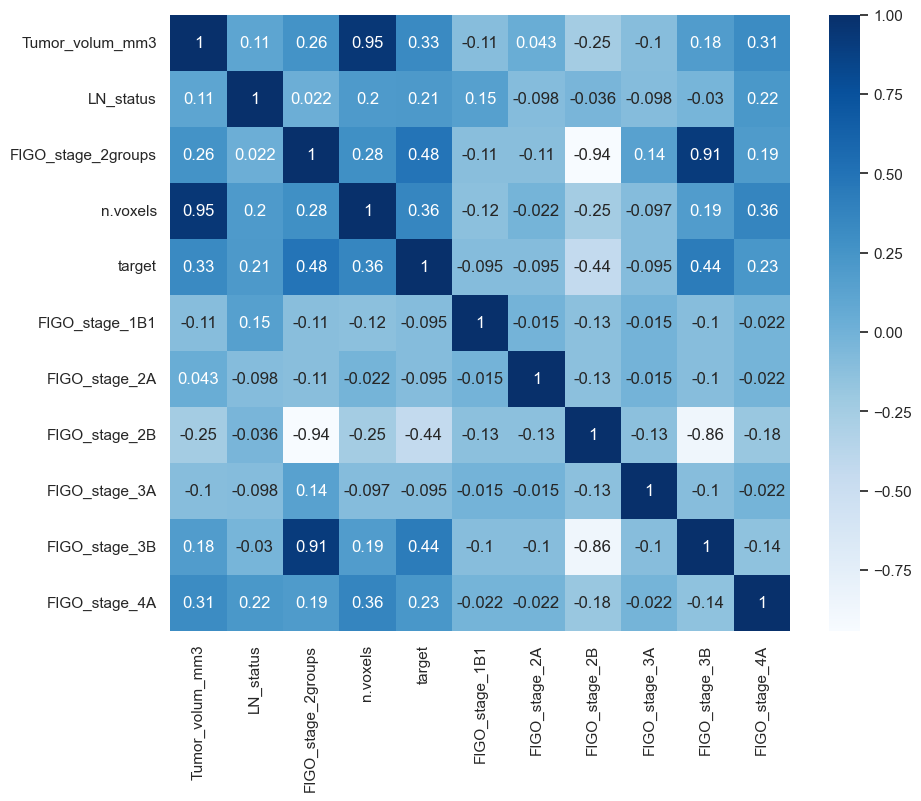

In [29]:
plt.figure(figsize=(10,8))
sns.heatmap(clinical_data.corr(numeric_only=True), annot=True, cmap='Blues')

<AxesSubplot: >

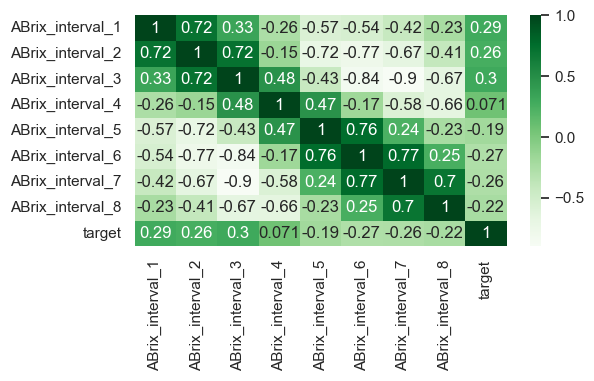

In [30]:
plt.figure(figsize=(6,3))
sns.heatmap(abrix.corr(numeric_only=True), annot=True, cmap='Greens')

<AxesSubplot: >

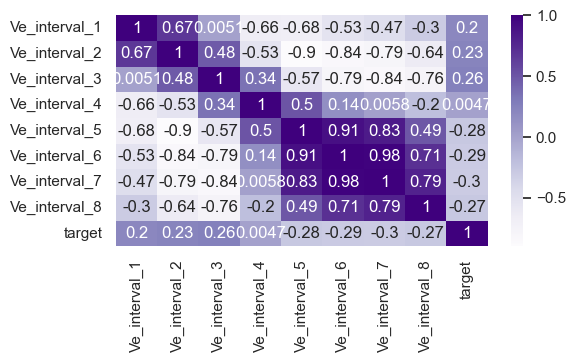

In [31]:
plt.figure(figsize=(6,3))
sns.heatmap(ve.corr(numeric_only=True), annot=True, cmap='Purples')

<AxesSubplot: >

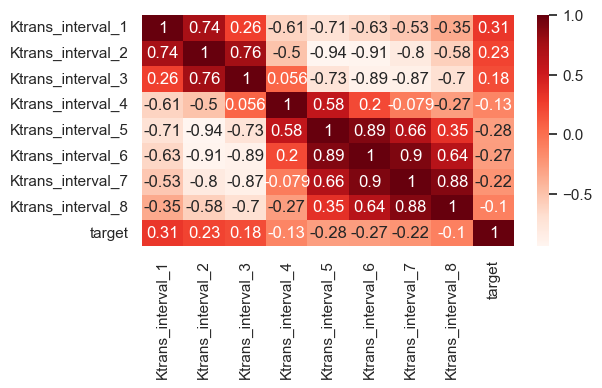

In [32]:
plt.figure(figsize=(6,3))
sns.heatmap(ktrans.corr(numeric_only=True), annot=True, cmap='Reds')

<AxesSubplot: >

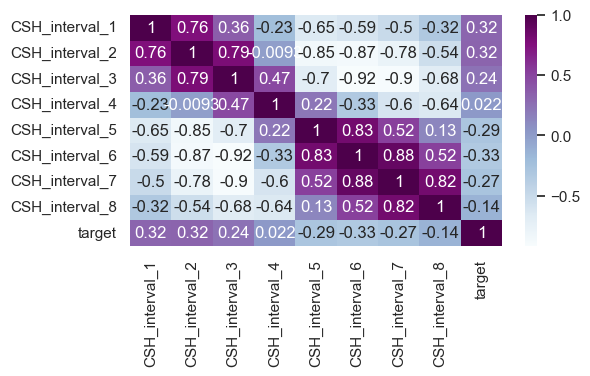

In [33]:
plt.figure(figsize=(6,3))
sns.heatmap(csh.corr(numeric_only=True), annot=True, cmap='BuPu')

<AxesSubplot: >

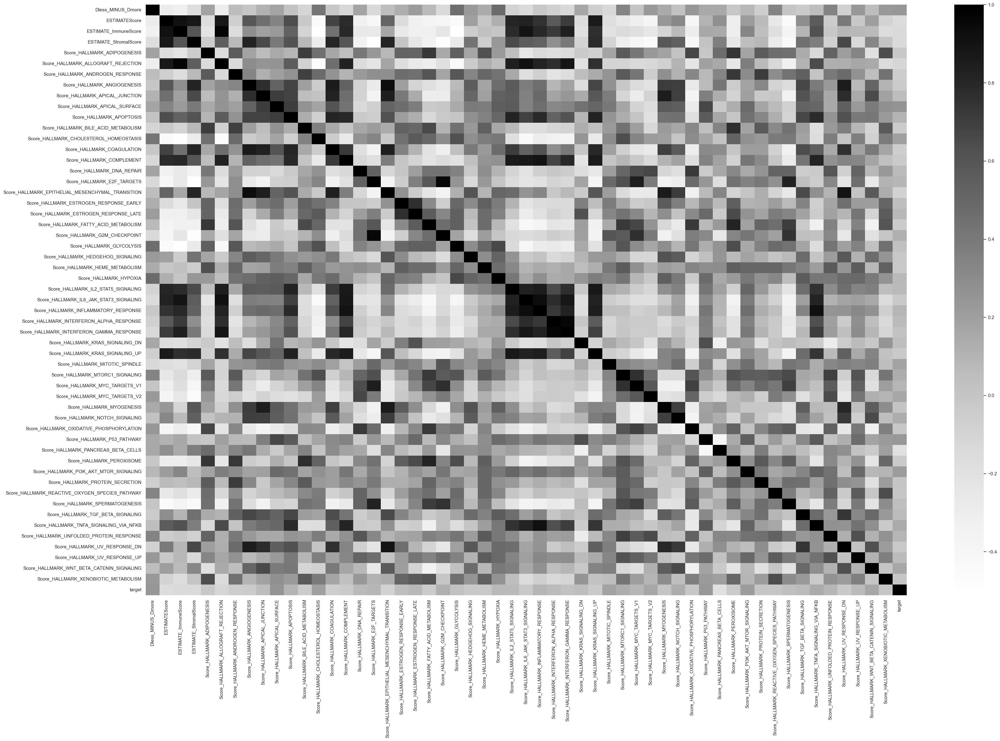

In [34]:
plt.figure(figsize=(40,25))
sns.heatmap(gene_scores.corr(numeric_only=True), annot=False, cmap='Greys')

## All_Data Analysis

In [35]:
# Concatenate all the data blocks
all_data = pd.concat([clinical_data, gene_scores.iloc[:,:-1], 
                      abrix.iloc[:,:-1], ve.iloc[:,:-1], 
                      ktrans.iloc[:,:-1], csh.iloc[:,:-1]], axis=1)

In [36]:
# all_data.to_excel('concatenated_data.xlsx')

In [37]:
all_data.shape

(67, 97)

In [38]:
all_data.head()

,Tumor_volum_mm3,LN_status,FIGO_stage_2groups,n.voxels,target,FIGO_stage_1B1,FIGO_stage_2A,FIGO_stage_2B,FIGO_stage_3A,FIGO_stage_3B,FIGO_stage_4A,Dless_MINUS_Dmore,ESTIMATEScore,ESTIMATE_ImmuneScore,ESTIMATE_StromalScore,Score_HALLMARK_ADIPOGENESIS,Score_HALLMARK_ALLOGRAFT_REJECTION,Score_HALLMARK_ANDROGEN_RESPONSE,Score_HALLMARK_ANGIOGENESIS,Score_HALLMARK_APICAL_JUNCTION,Score_HALLMARK_APICAL_SURFACE,Score_HALLMARK_APOPTOSIS,Score_HALLMARK_BILE_ACID_METABOLISM,Score_HALLMARK_CHOLESTEROL_HOMEOSTASIS,Score_HALLMARK_COAGULATION,Score_HALLMARK_COMPLEMENT,Score_HALLMARK_DNA_REPAIR,Score_HALLMARK_E2F_TARGETS,Score_HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,Score_HALLMARK_ESTROGEN_RESPONSE_EARLY,Score_HALLMARK_ESTROGEN_RESPONSE_LATE,Score_HALLMARK_FATTY_ACID_METABOLISM,Score_HALLMARK_G2M_CHECKPOINT,Score_HALLMARK_GLYCOLYSIS,Score_HALLMARK_HEDGEHOG_SIGNALING,Score_HALLMARK_HEME_METABOLISM,Score_HALLMARK_HYPOXIA,Score_HALLMARK_IL2_STAT5_SIGNALING,Score_HALLMARK_IL6_JAK_STAT3_SIGNALING,Score_HALLMARK_INFLAMMATORY_RESPONSE,Score_HALLMARK_INTERFERON_ALPHA_RESPONSE,Score_HALLMARK_INTERFERON_GAMMA_RESPONSE,Score_HALLMARK_KRAS_SIGNALING_DN,Score_HALLMARK_KRAS_SIGNALING_UP,Score_HALLMARK_MITOTIC_SPINDLE,Score_HALLMARK_MTORC1_SIGNALING,Score_HALLMARK_MYC_TARGETS_V1,Score_HALLMARK_MYC_TARGETS_V2,Score_HALLMARK_MYOGENESIS,Score_HALLMARK_NOTCH_SIGNALING,Score_HALLMARK_OXIDATIVE_PHOSPHORYLATION,Score_HALLMARK_P53_PATHWAY,Score_HALLMARK_PANCREAS_BETA_CELLS,Score_HALLMARK_PEROXISOME,Score_HALLMARK_PI3K_AKT_MTOR_SIGNALING,Score_HALLMARK_PROTEIN_SECRETION,Score_HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY,Score_HALLMARK_SPERMATOGENESIS,Score_HALLMARK_TGF_BETA_SIGNALING,Score_HALLMARK_TNFA_SIGNALING_VIA_NFKB,Score_HALLMARK_UNFOLDED_PROTEIN_RESPONSE,Score_HALLMARK_UV_RESPONSE_DN,Score_HALLMARK_UV_RESPONSE_UP,Score_HALLMARK_WNT_BETA_CATENIN_SIGNALING,Score_HALLMARK_XENOBIOTIC_METABOLISM,ABrix_interval_1,ABrix_interval_2,ABrix_interval_3,ABrix_interval_4,ABrix_interval_5,ABrix_interval_6,ABrix_interval_7,ABrix_interval_8,Ve_interval_1,Ve_interval_2,Ve_interval_3,Ve_interval_4,Ve_interval_5,Ve_interval_6,Ve_interval_7,Ve_interval_8,Ktrans_interval_1,Ktrans_interval_2,Ktrans_interval_3,Ktrans_interval_4,Ktrans_interval_5,Ktrans_interval_6,Ktrans_interval_7,Ktrans_interval_8,CSH_interval_1,CSH_interval_2,CSH_interval_3,CSH_interval_4,CSH_interval_5,CSH_interval_6,CSH_interval_7,CSH_interval_8
PasientID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
MM001,31360.0,1,0,6663.0,0,0.0,0.0,1.0,0.0,0.0,0.0,-4.238792,2509.505993,1780.195983,729.310009,0.037097,0.237999,0.015490,0.485889,0.210362,0.223405,0.121349,0.065917,0.034499,0.322402,0.084143,-0.015899,-0.330958,0.526704,0.240871,0.167720,-0.014807,-0.204620,-0.051364,0.210407,0.030783,0.075611,0.086735,0.156179,0.061202,0.545083,0.423470,0.225048,0.254655,-0.038764,-0.146990,-0.239393,-0.116683,0.324844,0.271715,-0.039910,0.076101,0.013122,-0.060804,-0.005677,-0.085847,-0.089787,-0.089580,0.020255,0.125268,-0.052568,0.201767,0.107139,0.200830,0.057854,0.000902,0.033970,0.214640,0.292951,0.194799,0.100706,0.081617,0.080415,0.004843,0.054782,0.208535,0.259080,0.199758,0.115466,0.064467,0.093069,0.008777,0.213832,0.349879,0.244098,0.108959,0.046308,0.023608,0.004540,0.000908,0.062803,0.293130,0.325363,0.182506,0.082778,0.042978,0.009534
MM002,23392.0,1,0,11344.0,1,0.0,0.0,1.0,0.0,0.0,0.0,5.241397,-435.225658,338.215368,-773.441026,0.060445,-0.564496,0.044063,-0.408533,-0.100194,-0.078773,-0.217237,0.019987,0.067123,-0.379611,-0.510269,0.190384,0.298068,-0.466492,0.005482,0.092550,0.213954,0.185181,0.011556,-0.018012,0.021029,-0.164302,-0.290524,-0.487714,-0.369229,-0.676635,-0.623289,0.207948,-0.415653,0.074502,0.081541,0.177755,0.308267,0.073638,-0.124417,0.182671,-0.026659,-0.052425,0.094314,0.047985,0.038560,0.140771,0.196195,-0.185340,-0.290867,-0.017314,-0.192700,0.028597,0.058458,0.107080,0.004612,0.068476,0.237094,0.277009,0.189906,0.105375,0.080628,0.036899

<AxesSubplot: >

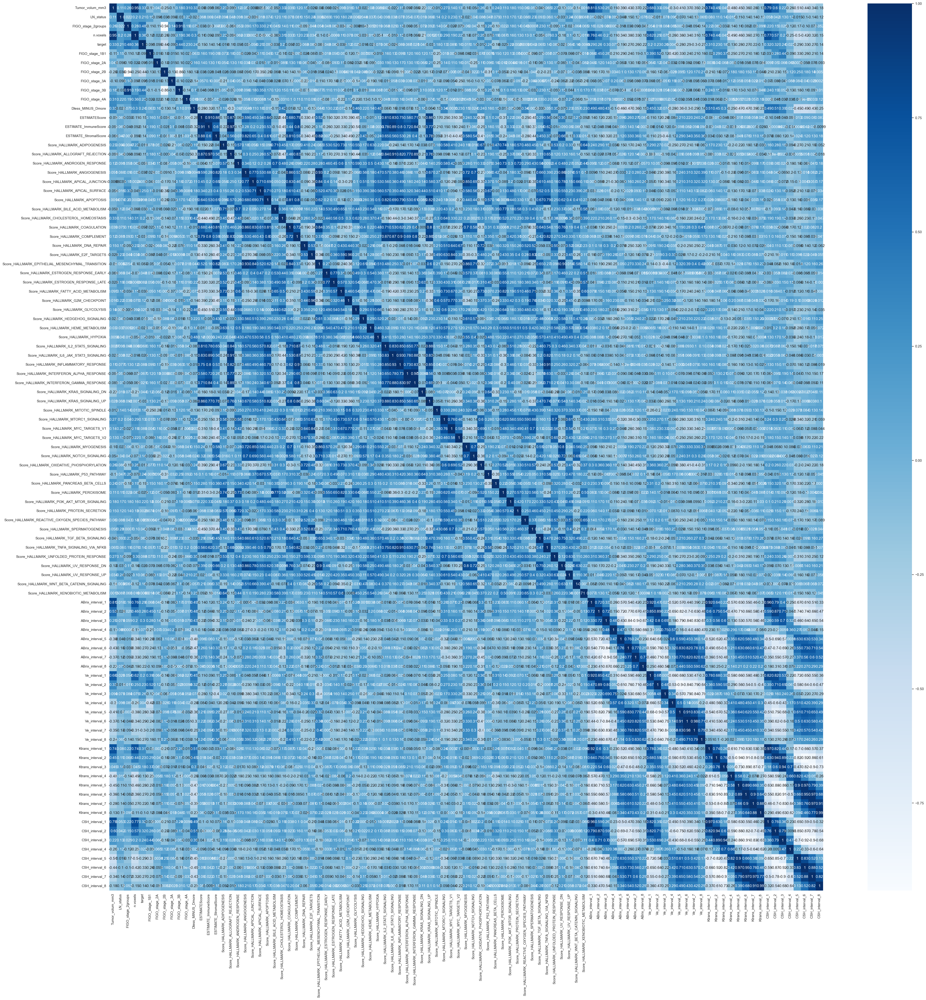

In [39]:
plt.figure(figsize=(50,50))
sns.heatmap(all_data.corr(numeric_only=True), annot=True, cmap='Blues')

In [40]:
# Stratified KFold train_test_split
def stratified_KFold(data, n_folds):
    """
    Creates a dictionary including a "n_folds" folded train_test_split
    
    Parameters
    ----------
    data: Data to be split
    n_dolds: Desired number of folds
    
    Returns
    -------
    dict: Including "n_folds" folded train_test_split on the data
    """
    
    data_dict = {}
    skf = StratifiedKFold(n_splits=n_folds)
    
    for indx, (train_index, test_index) in enumerate(skf.split(data.drop("target", axis=1), data["target"])):
        train_data = data.iloc[train_index].drop("target", axis=1)
        train_label = data.iloc[train_index]["target"]
        test_data = data.iloc[test_index].drop("target", axis=1)
        test_label = data.iloc[test_index]["target"]
        data_dict[f'fold_{indx+1}'] = dict(train=dict(data=train_data, label=train_label), 
                                            test=dict(data=test_data, label=test_label))
    
    return data_dict

In [41]:
def dimension_printer(data_dict):
    for key in data_dict.keys():
        print(f"============== {key} ==============")
        print(f"Training data shape: {data_dict[f'{key}']['train']['data'].shape}")
        print(f"Training labels shape: {data_dict[f'{key}']['train']['label'].shape}")
        print(f"Test data shape: {data_dict[f'{key}']['test']['data'].shape}")
        print(f"Test labels shape: {data_dict[f'{key}']['test']['label'].shape}")

In [42]:
all_data = stratified_KFold(all_data, 7) # Used 7 folds to get train_test_split ratio of 85/15

In [43]:
# Dimensions
dimension_printer(all_data)

============== fold_1 ==============
Training data shape: (57, 96)
Training labels shape: (57,)
Test data shape: (10, 96)
Test labels shape: (10,)
============== fold_2 ==============
Training data shape: (57, 96)
Training labels shape: (57,)
Test data shape: (10, 96)
Test labels shape: (10,)
============== fold_3 ==============
Training data shape: (57, 96)
Training labels shape: (57,)
Test data shape: (10, 96)
Test labels shape: (10,)
============== fold_4 ==============
Training data shape: (57, 96)
Training labels shape: (57,)
Test data shape: (10, 96)
Test labels shape: (10,)
============== fold_5 ==============
Training data shape: (58, 96)
Training labels shape: (58,)
Test data shape: (9, 96)
Test labels shape: (9,)
============== fold_6 ==============
Training data shape: (58, 96)
Training labels shape: (58,)
Test data shape: (9, 96)
Test labels shape: (9,)
============== fold_7 ==============
Training data shape: (58, 96)
Training labels shape: (58,)
Test data shape: (9, 96)
T

In [44]:
list(all_data['fold_7']['test']['data'].index)

['MM172',
 'MM178',
 'MM179',
 'MM180',
 'MM182',
 'MM185',
 'MM189',
 'MM191',
 'MM192']

In [45]:
all_data['fold_1']['train']['label'].value_counts()

0    36
1    21
Name: target, dtype: int64

#### Training different models using all available features in the dataset

In [46]:
def costum_gridSearchCV(train_data, train_labels, model_name, smote, pca):
    """
    1) Creates a pipeline including a classification model.
    2) Sets the model's hyperparameters.
    3) Implements a GridSearchCV using the created pipeline, the hyperparameter grid, and the specified scoring metrics.
    
    Parameters
    ----------
    train_data: Training data
    train_labels: Training data labels
    model_name: Either 'Logistic_Regression', 'Random_Forest', or 'SVM'
    smote: Whether to balance the data using the SMOTE method.
    pca: Whether to trasform the data using PCA.
    
    Returns
    -------
    dict: Including the GridSearchCV result and the total training time.
    """
    
    standard_scaler = StandardScaler()
    smot = SMOTE(random_state=1, sampling_strategy='minority')
    pc = PCA(.95)
    
    if smote and pca:
        models = {"Logistic_Regression": make_pipeline(smot, standard_scaler, pc, SGDClassifier(random_state=1)),
                  "Random_Forest": make_pipeline(smot, standard_scaler, pc, RandomForestClassifier(random_state=1)),
                  "SVM": make_pipeline(smot, standard_scaler, pc, SVC(random_state=1))}
    elif smote:
        models = {"Logistic_Regression": make_pipeline(smot, standard_scaler, SGDClassifier(random_state=1)),
                  "Random_Forest": make_pipeline(smot, standard_scaler, RandomForestClassifier(random_state=1)),
                  "SVM": make_pipeline(smot, standard_scaler, SVC(random_state=1))}
    elif pca:
        models = {"Logistic_Regression": make_pipeline(standard_scaler, pc, SGDClassifier(random_state=1)),
                  "Random_Forest": make_pipeline(standard_scaler, pc, RandomForestClassifier(random_state=1)),
                  "SVM": make_pipeline(standard_scaler, pc, SVC(random_state=1))}
    else:
        models = {"Logistic_Regression": make_pipeline(standard_scaler, SGDClassifier(random_state=1)),
                  "Random_Forest": make_pipeline(standard_scaler, RandomForestClassifier(random_state=1)),
                  "SVM": make_pipeline(standard_scaler, SVC(random_state=1))}
    
    scores = {'mcc': make_scorer(matthews_corrcoef), 'accuracy': make_scorer(accuracy_score)}

    c_range = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0]
    sgdclassifier__loss = [['log_loss']] # The loss function to be used. ‘log_loss’ gives logistic regression.
    sgdclassifier__penalty = [['elasticnet', None]] # The penalty (aka regularization term) to be used.
    sgdclassifier__alpha = [[0.0, 0.1, 1.0, 10.0]] # Constant that multiplies the regularization term.
    sgdclassifier__l1_ratio = [[0.0, 0.5, 1.0]] # The Elastic Net mixing parameter, with 0 <= l1_ratio <= 1.
    randomforestclassifier__criterion = [['entropy'], ['gini']] # The function to measure the quality of a split.
    n_estimators = [i for i in range(500, 2500, 500)] # parameter n_estimators for Random Forest
    svc__kernel = [['linear'], ['rbf']] # Specifies the kernel type to be used in the algorithm.

    SGDClassifier_param_grid = [{'sgdclassifier__loss': sgdclassifier__loss[0],
                                 'sgdclassifier__penalty': sgdclassifier__penalty[0],
                                 'sgdclassifier__alpha': sgdclassifier__alpha[0],
                                 'sgdclassifier__l1_ratio': sgdclassifier__l1_ratio[0], 
                                 'sgdclassifier__max_iter': [100, 1000, 8000]}]
    
    randomForest_param_grid = [{'randomforestclassifier__criterion': randomforestclassifier__criterion[0], 
                                'randomforestclassifier__n_estimators': n_estimators},
                               {'randomforestclassifier__criterion': randomforestclassifier__criterion[1], 
                                'randomforestclassifier__n_estimators': n_estimators}]
    
    supportVectorClassifier_param_grid = [{'svc__C': c_range, 
                                           'svc__kernel': svc__kernel[0]}, 
                                          {'svc__C': c_range, 
                                           'svc__gamma': c_range, 
                                           'svc__kernel': svc__kernel[1]}]

    param_grids = {"Logistic_Regression": SGDClassifier_param_grid,
                   "Random_Forest": randomForest_param_grid,
                   "SVM": supportVectorClassifier_param_grid}

    results = {}
    t1 = time.time()
    gs = GridSearchCV(estimator = models[model_name], 
                      param_grid = param_grids[model_name], 
                      cv=LeaveOneOut(), 
                      n_jobs=-1, 
                      verbose=2, 
                      scoring=scores, 
                      refit='mcc')

    gs = gs.fit(train_data, train_labels)
    t2 = time.time()
    results[f'{model_name}'] = gs
    results[f'{model_name}_total_training_time'] = t2-t1
    
    return results

In [47]:
def KFold_gridSearchCV(data, model_name, smote=False, pca=False):
    """
    Implements a KFold GridSearchCV on the provided data.
    
    Parameters
    ----------
    data: Data to be used in GridSearcCV.
    model_name: Either 'Logistic_Regression', 'Random_Forest', or 'SVM'.
    smote: Whether to balance the data using the SMOTE method (by default False.)
    pca: Whether to trasform the data using PCA (by default False.)
    
    Returns
    -------
    dict: Including a GridSearchCV result for each fold in the data.
    """
    
    data_dict = {}
    
    for key in data.keys():
        result = costum_gridSearchCV(data[f"{key}"]['train']['data'], 
                                     data[f"{key}"]['train']['label'], 
                                     model_name, 
                                     smote, 
                                     pca)
        data_dict[key]= result
    
    return data_dict

In [48]:
def print_hyperParameters(results, dataset_name):
    """
    Prints hyperparameter setting in the model and the total training time.
    """
    for key in results.keys():
        print(f"======================= {dataset_name}_{key} ========================")
        print('*'*20, f'{list(results[key].keys())[0]}', '*'*20)
        print(f"Best parameters: {list(results[key].values())[0].best_params_}")
        print(f"Total training time: {list(results[key].values())[1]: .1f} seconds \n")

In [49]:
def make_predictions(results, data, dataset_name):
    """
    Prints prediction results
    """
    for key in results.keys():
        test_data = data[f'{key}']['test']['data']
        test_labels = data[f'{key}']['test']['label']
        print(f"======================== {dataset_name}_{key} ========================")
        score = list(results[key].values())[0].score(test_data, test_labels)
        predictions = list(results[key].values())[0].predict(test_data)
        print('*'*20, f'{list(results[key].keys())[0]} ', '*'*20)
        print(f'{classification_report(test_labels, predictions)}')
        print('MCC Score: ', f'{round(score, 3)} \n')

In [44]:
all_results = KFold_gridSearchCV(all_data, 'Logistic_Regression')

Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 58 folds for each of 72 candidates, totalling 4176 fits
Fitting 58 folds for each of 72 candidates, totalling 4176 fits
Fitting 58 folds for each of 72 candidates, totalling 4176 fits


In [45]:
print_hyperParameters(all_results, 'All_Data')

======================= All_Data_fold_1 ========================
******************** Logistic_Regression ********************
Best parameters: {'sgdclassifier__alpha': 0.1, 'sgdclassifier__l1_ratio': 0.0, 'sgdclassifier__loss': 'log_loss', 'sgdclassifier__max_iter': 100, 'sgdclassifier__penalty': 'elasticnet'}
Total training time:  81.8 seconds 

======================= All_Data_fold_2 ========================
******************** Logistic_Regression ********************
Best parameters: {'sgdclassifier__alpha': 0.1, 'sgdclassifier__l1_ratio': 0.0, 'sgdclassifier__loss': 'log_loss', 'sgdclassifier__max_iter': 100, 'sgdclassifier__penalty': 'elasticnet'}
Total training time:  64.0 seconds 

======================= All_Data_fold_3 ========================
******************** Logistic_Regression ********************
Best parameters: {'sgdclassifier__alpha': 0.1, 'sgdclassifier__l1_ratio': 0.0, 'sgdclassifier__loss': 'log_loss', 'sgdclassifier__max_iter': 100, 'sgdclassifier__penalty': '

In [42]:
make_predictions(all_results, all_data, 'All_Data')

======================== All_Data_fold_1 ========================
******************** Logistic_Regression  ********************
              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.50      0.50      0.50         4

    accuracy                           0.60        10
   macro avg       0.58      0.58      0.58        10
weighted avg       0.60      0.60      0.60        10

MCC Score:  0.167 

======================== All_Data_fold_2 ========================
******************** Logistic_Regression  ********************
              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.67      1.00      0.80         4

    accuracy                           0.80        10
   macro avg       0.83      0.83      0.80        10
weighted avg       0.87      0.80      0.80        10

MCC Score:  0.667 

======================== All_Data_fold_3 =======

In [127]:
all_results = KFold_gridSearchCV(all_data, 'Random_Forest')

Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 58 folds for each of 8 candidates, totalling 464 fits
Fitting 58 folds for each of 8 candidates, totalling 464 fits
Fitting 58 folds for each of 8 candidates, totalling 464 fits


In [128]:
print_hyperParameters(all_results, 'All_Data')

======================= All_Data_fold_1 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 500}
Total training time:  850.4 seconds 

======================= All_Data_fold_2 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 500}
Total training time:  865.5 seconds 

======================= All_Data_fold_3 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 500}
Total training time:  856.0 seconds 

======================= All_Data_fold_4 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', 'ra

In [129]:
make_predictions(all_results, all_data, 'All_Data')

======================== All_Data_fold_1 ========================
******************** Random_Forest  ********************
              precision    recall  f1-score   support

           0       0.75      1.00      0.86         6
           1       1.00      0.50      0.67         4

    accuracy                           0.80        10
   macro avg       0.88      0.75      0.76        10
weighted avg       0.85      0.80      0.78        10

MCC Score:  0.612 

======================== All_Data_fold_2 ========================
******************** Random_Forest  ********************
              precision    recall  f1-score   support

           0       1.00      0.83      0.91         6
           1       0.80      1.00      0.89         4

    accuracy                           0.90        10
   macro avg       0.90      0.92      0.90        10
weighted avg       0.92      0.90      0.90        10

MCC Score:  0.816 

======================== All_Data_fold_3 ===================

In [130]:
all_results = KFold_gridSearchCV(all_data, 'SVM')

Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 58 folds for each of 56 candidates, totalling 3248 fits
Fitting 58 folds for each of 56 candidates, totalling 3248 fits
Fitting 58 folds for each of 56 candidates, totalling 3248 fits


In [131]:
print_hyperParameters(all_results, 'All_Data')

======================= All_Data_fold_1 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  26.2 seconds 

======================= All_Data_fold_2 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  23.2 seconds 

======================= All_Data_fold_3 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  28.0 seconds 

======================= All_Data_fold_4 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  25.8 seconds 

======================= All_Data_fold_5 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'l

In [132]:
make_predictions(all_results, all_data, 'All_Data')

======================== All_Data_fold_1 ========================
******************** SVM  ********************
              precision    recall  f1-score   support

           0       0.60      1.00      0.75         6
           1       0.00      0.00      0.00         4

    accuracy                           0.60        10
   macro avg       0.30      0.50      0.37        10
weighted avg       0.36      0.60      0.45        10

MCC Score:  0.0 

======================== All_Data_fold_2 ========================
******************** SVM  ********************
              precision    recall  f1-score   support

           0       0.60      1.00      0.75         6
           1       0.00      0.00      0.00         4

    accuracy                           0.60        10
   macro avg       0.30      0.50      0.37        10
weighted avg       0.36      0.60      0.45        10

MCC Score:  0.0 

======================== All_Data_fold_3 ========================
******************

#### Elastic Net Hyperparameter Selection

In [50]:
def rent_modeler(data, c_params=None, l1_ratios=None):
    """
    Creates a RENT model for each data fold in the provided data dictionary.
    
    Parameters
    ----------
    data: A dictionary including training and test data for several train_test_splits.
    c_params:
    l1_ratios:
    
    Returns
    -------
    dict: Including a RENT model for each data fold.
    """
    
    if c_params is None:
        c_params = [0.001, 0.01, 0.1, 1.0, 10, 100]
        
    if l1_ratios is None:
        l1_ratios = [0, 0.1, 0.25, 0.5, 0.75, 0.9, 1]

    model_dict = {}
    for key in data.keys():
        model_dict[key] = RENT.RENT_Classification(data=data[f'{key}']['train']['data'], 
                                                   target=data[f'{key}']['train']['label'], 
                                                   feat_names=data[f'{key}']['train']['data'].columns, 
                                                   C=c_params, 
                                                   l1_ratios=l1_ratios,
                                                   autoEnetParSel=False,
                                                   poly='OFF',
                                                   testsize_range=(0.25,0.25),
                                                   scoring='mcc',
                                                   classifier='logreg',
                                                   K=100,
                                                   random_state=2,
                                                   verbose=1)
    
    return model_dict

In [51]:
def rent_trainer(models):
    """
    Trains the provided RENT models.
    
    Parameters
    ----------
    models: A dictionary including several folds and a RENT model for each of them.
    
    Returns
    -------
    dict: Including a trained RENT model for each data fold.
    """
    
    for key in models.keys():
        models[key].train()
    
    return models

In [52]:
def print_RENT_values(models, dataset_name):
    """Prints the RENTs training times and their ElasticNet values"""
    for key in models.keys():
        print(f"======================= {dataset_name}_RENT_{key} ========================")
        print(f"Total RENT training time: {models[key].get_runtime(): .1f} seconds")
        print(f"RENT selected Elastic Net values: {models[key].get_enet_params()}\n")

In [25]:
all_rents = rent_modeler(all_data)

data dimension: (57, 96)  data type: <class 'pandas.core.frame.DataFrame'>
target dimension: (57,)
regularization parameters C: [0.001, 0.01, 0.1, 1.0, 10, 100]
elastic net l1_ratios: [0, 0.1, 0.25, 0.5, 0.75, 0.9, 1]
poly: OFF
number of models in ensemble: 100
random state: 2
verbose: 1
classifier: logreg
scoring: mcc
data dimension: (57, 96)  data type: <class 'pandas.core.frame.DataFrame'>
target dimension: (57,)
regularization parameters C: [0.001, 0.01, 0.1, 1.0, 10, 100]
elastic net l1_ratios: [0, 0.1, 0.25, 0.5, 0.75, 0.9, 1]
poly: OFF
number of models in ensemble: 100
random state: 2
verbose: 1
classifier: logreg
scoring: mcc
data dimension: (57, 96)  data type: <class 'pandas.core.frame.DataFrame'>
target dimension: (57,)
regularization parameters C: [0.001, 0.01, 0.1, 1.0, 10, 100]
elastic net l1_ratios: [0, 0.1, 0.25, 0.5, 0.75, 0.9, 1]
poly: OFF
number of models in ensemble: 100
random state: 2
verbose: 1
classifier: logreg
scoring: mcc
data dimension: (57, 96)  data type: 

In [26]:
all_rent_trained_models = rent_trainer(all_rents)

In [27]:
print_RENT_values(all_rent_trained_models, 'All_Data')

======================= All_Data_RENT_fold_1 ========================
Total RENT training time:  318.2 seconds
RENT selected Elastic Net values: (0.1, 0.25)

======================= All_Data_RENT_fold_2 ========================
Total RENT training time:  336.5 seconds
RENT selected Elastic Net values: (0.1, 0.25)

======================= All_Data_RENT_fold_3 ========================
Total RENT training time:  294.3 seconds
RENT selected Elastic Net values: (0.1, 0.25)

======================= All_Data_RENT_fold_4 ========================
Total RENT training time:  347.0 seconds
RENT selected Elastic Net values: (0.1, 0.25)

======================= All_Data_RENT_fold_5 ========================
Total RENT training time:  324.2 seconds
RENT selected Elastic Net values: (0.1, 0.25)

======================= All_Data_RENT_fold_6 ========================
Total RENT training time:  362.5 seconds
RENT selected Elastic Net values: (0.1, 0.25)

======================= All_Data_RENT_fold_7 =======

#### Training different models using only features selected by RENT

In [53]:
def rent_feature_selector(models, tau_1=None, tau_2=None, tau_3=None):
    """
    Indicates the selected features of the given RENT models using the desired "tau" values.
    
    Parameters
    ----------
    models: A dictionary including several folds and a RENT model for each of them.
    tau_1: Tau_1_cutoff in the RENT model.
    tau_2: Tau_2_cutoff in the RENT model.
    tau_3: Tau_3_cutoff in the RENT model.
    
    Returns
    -------
    dict: Including selected features for each train_test fold.
    """
    
    if tau_1 is None:
        tau_1 = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    if tau_2 is None:
        tau_2 = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    if tau_3 is None:
        tau_3 = 0.975
    if type(tau_1) is float:
        tau_1 = [tau_1]
    if type(tau_2) is float:
        tau_2 = [tau_2]
    
    fold_dict = {}
    for key in models.keys():
        features_dict = {}
        for item in list(zip(tau_1, tau_2)):
            features_dict[item] = models[key].select_features(tau_1_cutoff=item[0], 
                                                              tau_2_cutoff=item[1], 
                                                              tau_3_cutoff=tau_3)
        fold_dict[key] = features_dict
    
    return fold_dict

In [54]:
def print_RENT_features(models, train_data, dataset_name):
    """Prints selected RENT features for each train_test_split data fold"""
    for key, value in models.items():
        print(f"======================== {dataset_name}_{key} ========================")
        for ky in value.keys():
            print(f"For taue1={ky[0]} and tau2={ky[1]}, the selected features are:")
            print(f"{[train_data[key]['train']['data'].columns[item] for item in models[key][ky]]} \n")

In [55]:
def print_criteria_summary(models, dataset_name):
    """Prints the RENT criteria summary for each model included in the 'models' dictionary."""
    for key in models.keys():
        print(f"\n====================== {dataset_name}_{key}_RENT_Criteria =====================")
        print(models[key].get_summary_criteria())

In [28]:
all_RENT_selected_features = rent_feature_selector(all_rent_trained_models)

In [29]:
print_RENT_features(all_RENT_selected_features, all_data, "All_Data")

======================== All_Data_fold_1 ========================
For taue1=0.1 and tau2=0.1, the selected features are:
['Tumor_volum_mm3', 'LN_status', 'FIGO_stage_2groups', 'n.voxels', 'FIGO_stage_2B', 'FIGO_stage_3B', 'FIGO_stage_4A', 'Dless_MINUS_Dmore', 'ESTIMATE_ImmuneScore', 'Score_HALLMARK_ADIPOGENESIS', 'Score_HALLMARK_ANDROGEN_RESPONSE', 'Score_HALLMARK_APICAL_SURFACE', 'Score_HALLMARK_APOPTOSIS', 'Score_HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'Score_HALLMARK_FATTY_ACID_METABOLISM', 'Score_HALLMARK_IL2_STAT5_SIGNALING', 'Score_HALLMARK_INFLAMMATORY_RESPONSE', 'Score_HALLMARK_INTERFERON_ALPHA_RESPONSE', 'Score_HALLMARK_MITOTIC_SPINDLE', 'Score_HALLMARK_NOTCH_SIGNALING', 'Score_HALLMARK_P53_PATHWAY', 'Score_HALLMARK_PANCREAS_BETA_CELLS', 'Score_HALLMARK_PEROXISOME', 'Score_HALLMARK_PI3K_AKT_MTOR_SIGNALING', 'Score_HALLMARK_PROTEIN_SECRETION', 'Score_HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY', 'Score_HALLMARK_TGF_BETA_SIGNALING', 'Score_HALLMARK_TNFA_SIGNALING_VIA_NFKB', 'Score_HALLM

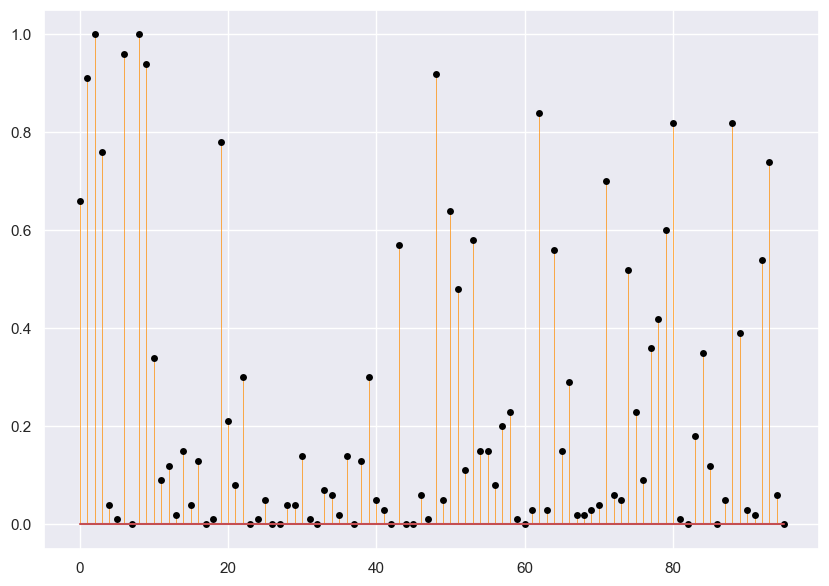

In [149]:
all_rent_trained_models['fold_1'].plot_selection_frequency()

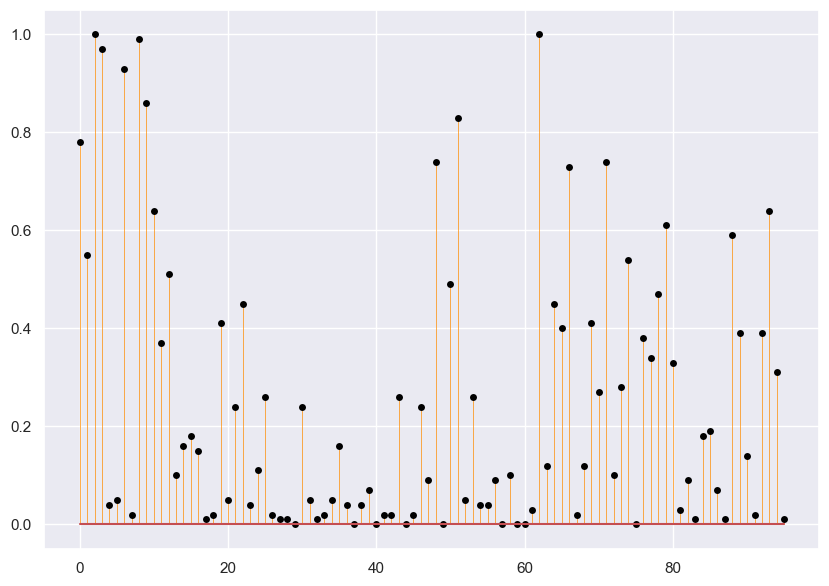

In [150]:
all_rent_trained_models['fold_4'].plot_selection_frequency()

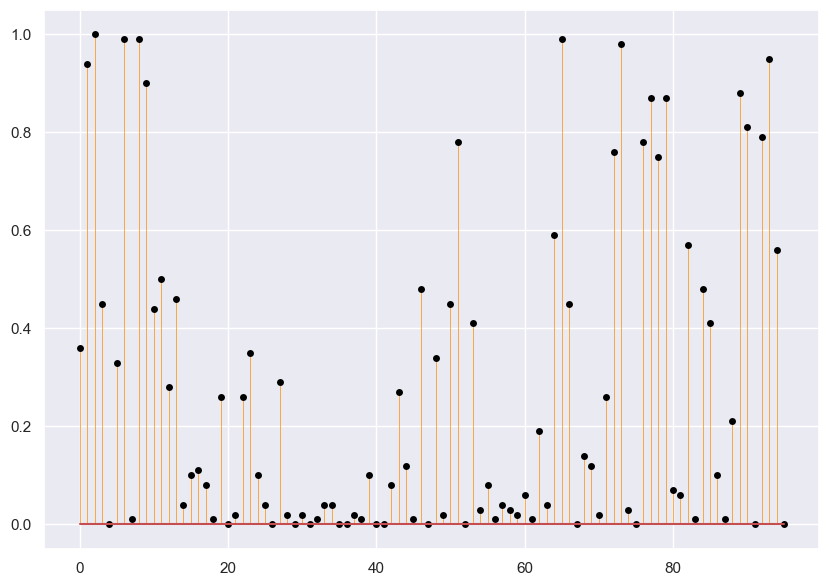

In [151]:
all_rent_trained_models['fold_7'].plot_selection_frequency()

#### Training different models using only features selected by RENT

In [56]:
def modeler(data_dict, features_dict, model, params, dataset_name, smote=False, pca=False):
    """
    Trains and prints the prediction scores of the desired classification model with the specified parameters
    
    Parameters
    ----------
    data_dict: Data to be used for model training and test.
    features_dict: A dictionary passed by the "rent_feature_selector" method
    model: The desired model (Either "Logistic_Regression", "Random_Forest", or "SVM")
    params: A dictionary of the desired model parameters:
            for Logistic_Regression: penalty, alpha, l1_ratio
            for Random_Forest: n_estimators, criterion
            for SVM: C, kernel
    dataset_name: The desired dataset name
    smote: Whether to balance the data using the SMOTE method (default: False).
    pca: Whether to trasform the data using PCA (default: False).
    """
        
    sm = SMOTE(random_state=99)
    sc = StandardScaler()
    for key in data_dict.keys():
        if smote and pca:
            pass
        elif smote:
            data_dict[key]['train']['data'], data_dict[key]['train']['label'] = sm.fit_resample(data_dict[key]['train']['data'], 
                                                                                                data_dict[key]['train']['label'])
        for tau_pair, feature_set in features_dict[key].items():
            if not len(feature_set):
                continue
            else:
                train_data_sc = sc.fit_transform(data_dict[key]['train']['data'].iloc[:, feature_set])
                test_data_sc = sc.transform(data_dict[key]['test']['data'].iloc[:, feature_set])

            if model == 'Logistic_Regression':
                penalty = params['penalty']
                alpha = params['alpha']
                l1_ratio = params['l1_ratio']
                prediction_model = SGDClassifier(loss='log_loss',
                                                 penalty=penalty,
                                                 alpha=alpha,
                                                 l1_ratio=l1_ratio,
                                                 max_iter=8000, 
                                                 random_state=2).fit(train_data_sc, data_dict[key]['train']['label'])
            elif model == 'Random_Forest':
                n_estimators = params['n_estimators']
                criterion = params['criterion']
                prediction_model = RandomForestClassifier(n_estimators=n_estimators,
                                                          criterion=criterion, 
                                                          random_state=3).fit(train_data_sc, data_dict[key]['train']['label'])
            elif model == 'SVM':
                c = params['C']
                kernel = params['kernel']
                prediction_model = SVC(C=c,
                                       kernel=kernel, 
                                       random_state=4).fit(train_data_sc, data_dict[key]['train']['label'])

            model_predictions = prediction_model.predict(test_data_sc)
            true_labels = data_dict[key]['test']['label']
            string1 = f"========================== {dataset_name}_{key} ============================"
            string2 = f"{model}_With_RENT_Features_For_(tau1={tau_pair[0]}, tau2={tau_pair[1]})"
            length = int((len(string1)-len(string2))/2)-1
            print(string1)
            print('*'*length, string2, '*'*length)
            print(f'{classification_report(true_labels, model_predictions)}')
            print(f"MCC Score: {matthews_corrcoef(true_labels, model_predictions)} \n")


In [30]:
params = dict(penalty='elasticnet', alpha=0.1, l1_ratio=0.0, max_iter=100)
modeler(all_data, all_RENT_selected_features, 'Logistic_Regression', params, 'All_Data')

========================== All_Data_fold_1 ============================
*** Logistic_Regression_With_RENT_Features_For_(tau1=0.1, tau2=0.1) ***
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.67      0.50      0.57         4

    accuracy                           0.70        10
   macro avg       0.69      0.67      0.67        10
weighted avg       0.70      0.70      0.69        10

MCC Score: 0.3563483225498992 

Total training time:  0.0 seconds 

========================== All_Data_fold_1 ============================
*** Logistic_Regression_With_RENT_Features_For_(tau1=0.2, tau2=0.2) ***
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.67      0.50      0.57         4

    accuracy                           0.70        10
   macro avg       0.69      0.67      0.67        10
weighted avg       0.70      0.70      0.69  

In [31]:
params = dict(n_estimators=500, criterion='entropy')
modeler(all_data, all_RENT_selected_features, 'Random_Forest', params, 'All_Data')

========================== All_Data_fold_1 ============================
****** Random_Forest_With_RENT_Features_For_(tau1=0.1, tau2=0.1) ******
              precision    recall  f1-score   support

           0       0.75      1.00      0.86         6
           1       1.00      0.50      0.67         4

    accuracy                           0.80        10
   macro avg       0.88      0.75      0.76        10
weighted avg       0.85      0.80      0.78        10

MCC Score: 0.6123724356957946 

Total training time:  1.5 seconds 

========================== All_Data_fold_1 ============================
****** Random_Forest_With_RENT_Features_For_(tau1=0.2, tau2=0.2) ******
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.67      0.50      0.57         4

    accuracy                           0.70        10
   macro avg       0.69      0.67      0.67        10
weighted avg       0.70      0.70      0.69  

In [32]:
params = dict(C=0.0001, kernel='linear')
modeler(all_data, all_RENT_selected_features, 'SVM', params, 'All_Data')

========================== All_Data_fold_1 ============================
*********** SVM_With_RENT_Features_For_(tau1=0.1, tau2=0.1) ***********
              precision    recall  f1-score   support

           0       0.60      1.00      0.75         6
           1       0.00      0.00      0.00         4

    accuracy                           0.60        10
   macro avg       0.30      0.50      0.37        10
weighted avg       0.36      0.60      0.45        10

MCC Score: 0.0 

Total training time:  0.0 seconds 

========================== All_Data_fold_1 ============================
*********** SVM_With_RENT_Features_For_(tau1=0.2, tau2=0.2) ***********
              precision    recall  f1-score   support

           0       0.60      1.00      0.75         6
           1       0.00      0.00      0.00         4

    accuracy                           0.60        10
   macro avg       0.30      0.50      0.37        10
weighted avg       0.36      0.60      0.45        10

MCC S

## Using SMOTE

#### All_Data - All Features

In [33]:
all_results = KFold_gridSearchCV(all_data, 'Logistic_Regression', smote=True)

Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 57 folds for each of 72 candidates, totalling 4104 fits
Fitting 58 folds for each of 72 candidates, totalling 4176 fits
Fitting 58 folds for each of 72 candidates, totalling 4176 fits
Fitting 58 folds for each of 72 candidates, totalling 4176 fits


In [34]:
print_hyperParameters(all_results, 'All_Data')

======================= All_Data_fold_1 ========================
******************** Logistic_Regression ********************
Best parameters: {'sgdclassifier__alpha': 0.1, 'sgdclassifier__l1_ratio': 0.0, 'sgdclassifier__loss': 'log_loss', 'sgdclassifier__max_iter': 100, 'sgdclassifier__penalty': 'elasticnet'}
Total training time:  201.8 seconds 

======================= All_Data_fold_2 ========================
******************** Logistic_Regression ********************
Best parameters: {'sgdclassifier__alpha': 0.1, 'sgdclassifier__l1_ratio': 0.0, 'sgdclassifier__loss': 'log_loss', 'sgdclassifier__max_iter': 100, 'sgdclassifier__penalty': 'elasticnet'}
Total training time:  229.5 seconds 

======================= All_Data_fold_3 ========================
******************** Logistic_Regression ********************
Best parameters: {'sgdclassifier__alpha': 0.1, 'sgdclassifier__l1_ratio': 0.0, 'sgdclassifier__loss': 'log_loss', 'sgdclassifier__max_iter': 100, 'sgdclassifier__penalty':

In [154]:
make_predictions(all_results, all_data, 'All_Data')

======================== All_Data_fold_1 ========================
******************** Logistic_Regression  ********************
              precision    recall  f1-score   support

           0       0.40      0.33      0.36         6
           1       0.20      0.25      0.22         4

    accuracy                           0.30        10
   macro avg       0.30      0.29      0.29        10
weighted avg       0.32      0.30      0.31        10

MCC Score:  -0.408 

======================== All_Data_fold_2 ========================
******************** Logistic_Regression  ********************
              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.60      0.75      0.67         4

    accuracy                           0.70        10
   macro avg       0.70      0.71      0.70        10
weighted avg       0.72      0.70      0.70        10

MCC Score:  0.408 

======================== All_Data_fold_3 ======

In [155]:
all_results = KFold_gridSearchCV(all_data, 'SVM', smote=True)

Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 57 folds for each of 56 candidates, totalling 3192 fits
Fitting 58 folds for each of 56 candidates, totalling 3248 fits
Fitting 58 folds for each of 56 candidates, totalling 3248 fits
Fitting 58 folds for each of 56 candidates, totalling 3248 fits


In [156]:
print_hyperParameters(all_results, 'All_Data')

======================= All_Data_fold_1 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  245.3 seconds 

======================= All_Data_fold_2 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  248.5 seconds 

======================= All_Data_fold_3 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  236.3 seconds 

======================= All_Data_fold_4 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel': 'linear'}
Total training time:  255.2 seconds 

======================= All_Data_fold_5 ========================
******************** SVM ********************
Best parameters: {'svc__C': 0.0001, 'svc__kernel'

In [157]:
make_predictions(all_results, all_data, 'All_Data')

======================== All_Data_fold_1 ========================
******************** SVM  ********************
              precision    recall  f1-score   support

           0       0.80      0.67      0.73         6
           1       0.60      0.75      0.67         4

    accuracy                           0.70        10
   macro avg       0.70      0.71      0.70        10
weighted avg       0.72      0.70      0.70        10

MCC Score:  0.408 

======================== All_Data_fold_2 ========================
******************** SVM  ********************
              precision    recall  f1-score   support

           0       1.00      0.50      0.67         6
           1       0.57      1.00      0.73         4

    accuracy                           0.70        10
   macro avg       0.79      0.75      0.70        10
weighted avg       0.83      0.70      0.69        10

MCC Score:  0.535 

======================== All_Data_fold_3 ========================
**************

In [158]:
all_results = KFold_gridSearchCV(all_data, 'Random_Forest', smote=True)

Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 57 folds for each of 8 candidates, totalling 456 fits
Fitting 58 folds for each of 8 candidates, totalling 464 fits
Fitting 58 folds for each of 8 candidates, totalling 464 fits
Fitting 58 folds for each of 8 candidates, totalling 464 fits


In [159]:
print_hyperParameters(all_results, 'All_Data')

======================= All_Data_fold_1 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 500}
Total training time:  1230.4 seconds 

======================= All_Data_fold_2 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 500}
Total training time:  904.9 seconds 

======================= All_Data_fold_3 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', 'randomforestclassifier__n_estimators': 500}
Total training time:  1533.5 seconds 

======================= All_Data_fold_4 ========================
******************** Random_Forest ********************
Best parameters: {'randomforestclassifier__criterion': 'entropy', '

In [160]:
make_predictions(all_results, all_data, 'All_Data')

======================== All_Data_fold_1 ========================
******************** Random_Forest  ********************
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.67      0.50      0.57         4

    accuracy                           0.70        10
   macro avg       0.69      0.67      0.67        10
weighted avg       0.70      0.70      0.69        10

MCC Score:  0.356 

======================== All_Data_fold_2 ========================
******************** Random_Forest  ********************
              precision    recall  f1-score   support

           0       1.00      0.67      0.80         6
           1       0.67      1.00      0.80         4

    accuracy                           0.80        10
   macro avg       0.83      0.83      0.80        10
weighted avg       0.87      0.80      0.80        10

MCC Score:  0.667 

======================== All_Data_fold_3 ===================

#### All_Data - RENT Features

In [174]:
params = dict(penalty='elasticnet', alpha=0.1, l1_ratio=0.0, max_iter=100)
modeler(all_data, all_RENT_selected_features, 'Logistic_Regression', params, 'All_Data', smote=True)

========================== All_Data_fold_1 ============================
*** Logistic_Regression_With_RENT_Features_For_(tau1=0.1, tau2=0.1) ***
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.67      0.50      0.57         4

    accuracy                           0.70        10
   macro avg       0.69      0.67      0.67        10
weighted avg       0.70      0.70      0.69        10

MCC Score: 0.3563483225498992 

========================== All_Data_fold_1 ============================
*** Logistic_Regression_With_RENT_Features_For_(tau1=0.2, tau2=0.2) ***
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.67      0.50      0.57         4

    accuracy                           0.70        10
   macro avg       0.69      0.67      0.67        10
weighted avg       0.70      0.70      0.69        10

MCC Score: 0.3563483225498

In [175]:
params = dict(n_estimators=500, criterion='entropy')
modeler(all_data, all_RENT_selected_features, 'Random_Forest', params, 'All_Data', smote=True)

========================== All_Data_fold_1 ============================
****** Random_Forest_With_RENT_Features_For_(tau1=0.1, tau2=0.1) ******
              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.50      0.50      0.50         4

    accuracy                           0.60        10
   macro avg       0.58      0.58      0.58        10
weighted avg       0.60      0.60      0.60        10

MCC Score: 0.16666666666666666 

========================== All_Data_fold_1 ============================
****** Random_Forest_With_RENT_Features_For_(tau1=0.2, tau2=0.2) ******
              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.50      0.50      0.50         4

    accuracy                           0.60        10
   macro avg       0.58      0.58      0.58        10
weighted avg       0.60      0.60      0.60        10

MCC Score: 0.166666666666

In [176]:
params = dict(C=0.0001, kernel='linear')
modeler(all_data, all_RENT_selected_features, 'SVM', params, 'All_Data', smote=True)

========================== All_Data_fold_1 ============================
*********** SVM_With_RENT_Features_For_(tau1=0.1, tau2=0.1) ***********
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.67      0.50      0.57         4

    accuracy                           0.70        10
   macro avg       0.69      0.67      0.67        10
weighted avg       0.70      0.70      0.69        10

MCC Score: 0.3563483225498992 

========================== All_Data_fold_1 ============================
*********** SVM_With_RENT_Features_For_(tau1=0.2, tau2=0.2) ***********
              precision    recall  f1-score   support

           0       0.67      0.67      0.67         6
           1       0.50      0.50      0.50         4

    accuracy                           0.60        10
   macro avg       0.58      0.58      0.58        10
weighted avg       0.60      0.60      0.60        10

MCC Score: 0.1666666666666